In [1]:
# importing libraries

import os
import sys
sys.path.append('../..')

from dotenv import load_dotenv, find_dotenv
_ = load_dotenv(find_dotenv())

import tensorflow as tf

from langchain.text_splitter import CharacterTextSplitter, TokenTextSplitter, SentenceTransformersTokenTextSplitter 
from langchain_community.document_loaders import SeleniumURLLoader 
from langchain_community.embeddings.sentence_transformer import SentenceTransformerEmbeddings
from langchain_community.vectorstores import Chroma 
from langchain_community.chat_models import ChatOllama 
from langchain_core.output_parsers import StrOutputParser
from langchain_core.prompts import ChatPromptTemplate 
from langchain_core.messages import SystemMessage 
from langchain.prompts import HumanMessagePromptTemplate 
from langchain_core.runnables import RunnablePassthrough

from chromadb.utils.embedding_functions import SentenceTransformerEmbeddingFunction
import chromadb

from sklearn.manifold import TSNE
import numpy as np
from tqdm import tqdm
import json

import mlflow
import time



2024-04-16 03:17:14.970852: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-04-16 03:17:15.932265: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-04-16 03:17:19.320565: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-16 03:17:23.522474: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [1]:
#!pip install pydantic==1.10.8

In [2]:
# testing tensorflow module
tf.config.experimental.list_physical_devices ('GPU')

[]

In [10]:
llm = ChatOllama (model="llama2", temperature=0)
prompt = ChatPromptTemplate.from_template("What was the total {topic} of microsoft in 2023?") 
chain = prompt | llm | StrOutputParser() 
print(chain.invoke({"topic": "revenue"}))

ConnectionError: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))

In [4]:
urls = ['https://www.microsoft.com/investor/reports/ar23/index.html']
loader = SeleniumURLLoader(urls=urls)
data = loader.load()
text = data[0].page_content

In [5]:
token_splitter = SentenceTransformersTokenTextSplitter(chunk_overlap=0, tokens_per_chunk=256) 
tokenized_text = token_splitter.split_text(text)
tokenized_text

['satya nadella chief executive officer dear shareholders, colleagues, customers, and partners : we are living through a time of historic challenge and opportunity. as i write this, the world faces ongoing economic, social, and geopolitical volatility. at the same time, we have entered a new age of ai that will fundamentally transform productivity for every individual, organization, and industry on earth, and help us address some of our most pressing challenges. this next generation of ai will reshape every software category and every business, including our own. forty - eight years after its founding, microsoft remains a consequential company because time and time again — from pc / server, to web / internet, to cloud / mobile — we have adapted to technological paradigm shifts. today, we are doing so once again, as we lead this new era. amid this transformation, our mission to empower every person and every organization on the planet to achieve more remains constant. as a company, we b

In [6]:
len(tokenized_text)

214

In [7]:
tokenized_text[0]

'satya nadella chief executive officer dear shareholders, colleagues, customers, and partners : we are living through a time of historic challenge and opportunity. as i write this, the world faces ongoing economic, social, and geopolitical volatility. at the same time, we have entered a new age of ai that will fundamentally transform productivity for every individual, organization, and industry on earth, and help us address some of our most pressing challenges. this next generation of ai will reshape every software category and every business, including our own. forty - eight years after its founding, microsoft remains a consequential company because time and time again — from pc / server, to web / internet, to cloud / mobile — we have adapted to technological paradigm shifts. today, we are doing so once again, as we lead this new era. amid this transformation, our mission to empower every person and every organization on the planet to achieve more remains constant. as a company, we be

In [8]:
embedding_function = SentenceTransformerEmbeddingFunction()

In [9]:
embedding_function(tokenized_text[0])

[[-0.08815004676580429,
  0.03891213238239288,
  -0.06267445534467697,
  0.025976870208978653,
  0.02127212844789028,
  0.03616543486714363,
  0.06472505629062653,
  0.0327303372323513,
  -0.02281225472688675,
  0.03426259756088257,
  -0.011476955376565456,
  -0.05585264414548874,
  0.07525283098220825,
  0.02892005257308483,
  -0.01218491792678833,
  -0.06143524497747421,
  0.0579327791929245,
  -0.023547545075416565,
  -0.037457775324583054,
  0.0077832965180277824,
  -0.04389440268278122,
  -0.0005846507847309113,
  -0.05005178973078728,
  0.052563294768333435,
  0.041017282754182816,
  0.02724764123558998,
  -0.007769166957587004,
  0.006663122680038214,
  -0.05828496441245079,
  -0.05827649310231209,
  -0.008283381350338459,
  0.0115403663367033,
  0.09883632510900497,
  0.01424640603363514,
  0.021976880729198456,
  -0.042441897094249725,
  0.016986656934022903,
  0.05459064990282059,
  0.02771942876279354,
  0.040375497192144394,
  -0.07192572206258774,
  -0.06973172724246979,
 

In [15]:
#chroma_client.delete_collection (name='microsoft_anual_report_2023')
chromadb_path='./db'
chroma_client = chromadb.Client() # chromadb.chromadb.PersistentClient(path=chromadb_path) 
chroma_collection=chroma_client.get_or_create_collection('microsoft_anual_report_2023', embedding_function=embedding_function, metadata={"hnsw:space": "cosine"}) 

chroma_collection.upsert(ids=[str(i) for i in range(len(tokenized_text))], documents=tokenized_text) 
chroma_collection.count()

Using embedded DuckDB without persistence: data will be transient


214

In [16]:
query= 'what was the total revenue?'
results = chroma_collection.query(query_texts=[query], n_results=5, include=['documents', 'embeddings', 'distances']) 
retrieved_documents = results['documents'][0]
retrieved_documents

['due to the integrated structure of our business, certain revenue recognized and costs incurred by one segment may benefit other segments. revenue from certain contracts is allocated among the segments based on the relative value of the underlying products and services, which can include allocation based on actual prices charged, prices when sold separately, or estimated costs plus a profit margin. cost of revenue is allocated in certain cases based on a relative revenue methodology. operating expenses that are allocated primarily include those relating to marketing of products and services from which multiple segments benefit and are generally allocated based on relative gross margin. in addition, certain costs are incurred at a corporate level and allocated to our segments. these allocated costs generally include legal, including settlements and fines, information technology, human resources, finance, excise taxes, field selling, shared facilities services, customer service and supp

In [19]:
results['distances']

[[0.44267797470092773,
  0.46713006496429443,
  0.48107051849365234,
  0.4919244647026062,
  0.5125722885131836]]

In [20]:
embeddings = chroma_collection.get(include=['embeddings'])['embeddings']

In [24]:
np.array(embeddings).shape

(214, 384)

In [25]:
embeddings_2 = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=5).fit_transform(np.array(embeddings))

In [26]:
embeddings_2.shape

(214, 2)

Text(0.5, 1.0, 'projected embeddings')

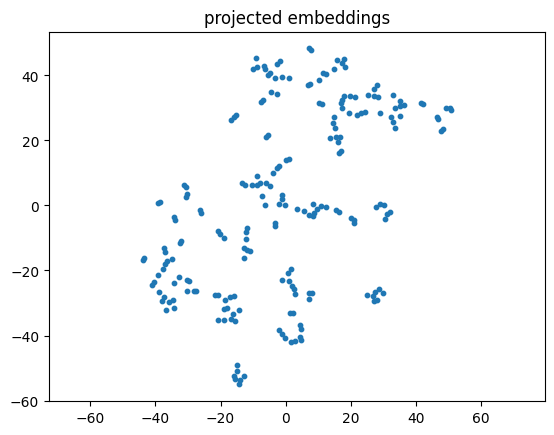

In [28]:
import matplotlib.pyplot as plt
plt.figure()
plt.scatter(embeddings_2[:,0], embeddings_2[:,1], s=10) 
plt.gca().set_aspect('equal', 'datalim')
plt.title('projected embeddings')

In [29]:
retrived_embeddings = results ['embeddings'][0] 
query_embeddings = embedding_function( [query])[0]

augmented_embeddings = embeddings + retrived_embeddings + [query_embeddings]

In [31]:
embeddings_2_aug = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=5).fit_transform(np.array(augmented_embeddings))

Text(0.5, 1.0, 'projected embeddings')

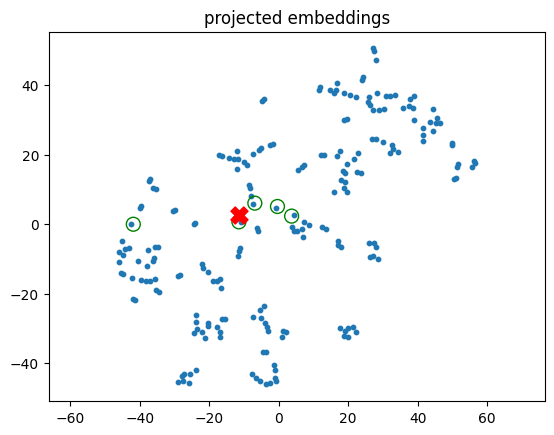

In [33]:
plt.figure()
plt.scatter(embeddings_2_aug[0:214,0], embeddings_2_aug[0:214,1], s=10)
plt.scatter(embeddings_2_aug[214:219,0], embeddings_2_aug[214:219,1], s=100, facecolors='none', edgecolors='g') 
plt.scatter (embeddings_2_aug [219,0], embeddings_2_aug [219,1], s=150, marker='X', color='r')
plt.gca().set_aspect('equal', 'datalim')
plt.title('projected embeddings')

In [37]:
context='\n\n'.join(retrieved_documents)
question = 'what was the total revenue?'

prompt_template = ChatPromptTemplate.from_messages(
    SystemMessage(
        content=(
            "You are helpful expert in financial research assistant. Your users are asking questions about information/context contained in an anual report."
            "You will be shown user's question, and the relavent context from the anual report. Answer the user's question using only this information."
        )
    ),
    HumanMessagePromptTemplate.from_template(
        """Based on the context below, answer the following question:
        Context: {context}
        Question: {question}
        """
    ),
)
#prompt chat_template.format_messages (question question, context=context)
#print (prompt)
print(prompt_template)

<>:5: SyntaxWarning: 'str' object is not callable; perhaps you missed a comma?
<>:5: SyntaxWarning: 'str' object is not callable; perhaps you missed a comma?
/tmp/ipykernel_8053/2373322239.py:5: SyntaxWarning: 'str' object is not callable; perhaps you missed a comma?
  'system'(
/tmp/ipykernel_8053/2373322239.py:5: SyntaxWarning: 'str' object is not callable; perhaps you missed a comma?
  'system'(
/tmp/ipykernel_8053/2373322239.py:5: SyntaxWarning: 'str' object is not callable; perhaps you missed a comma?
  'system'(
/tmp/ipykernel_8053/2373322239.py:5: SyntaxWarning: 'str' object is not callable; perhaps you missed a comma?
  'system'(
/tmp/ipykernel_8053/2373322239.py:5: SyntaxWarning: 'str' object is not callable; perhaps you missed a comma?
  'system'(


TypeError: 'str' object is not callable

In [35]:
llm = Chatollama(model ="Lllama2", temperature=0)
chain = prompt_template | llm | StrOutputParser()
print(chain.invoke({"context": context, "question": question}))

NameError: name 'Chatollama' is not defined

In [36]:
context = '\n\n'.join(retrieved_documents) 
question = 'what was the total revenue?'
prompt_template = ChatPromptTemplate.from_messages(
    SystemMessage(
        content=(
            "You are helpful expert in financial research assistant. Your users are asking questions about information/context contained in an anual report."
            "You will be shown user's question, and the relavent context from the anual report. Answer the user's question using only this information."
        )
    ),
    HumanMessagePromptTemplate.from_template(
        """Based on the context below, answer the following question using the JSON schema:
        Context: {context}
        Question: {question}
        JSON schema: {json_dumps}
        """
    ),
)

print(prompt_template)

ValueError: Unexpected message type: content. Use one of 'human', 'user', 'ai', 'assistant', or 'system'.